In [9]:
import torch
from models.networks import MetricModel
from datasets import UCIDataset
from data_utils import t_sne
import plotly.express as px
import seaborn as sns
from umap import UMAP

model = MetricModel()
dataset = UCIDataset('adult', mode='train')
checkpoint = torch.load('./logdir/checkpoints/last.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

output = model(dataset.features())
output = output.detach().numpy()

In [4]:
proj = UMAP(n_components=2)
new_features = proj.fit_transform(output)

<AxesSubplot:xlabel='x', ylabel='y'>

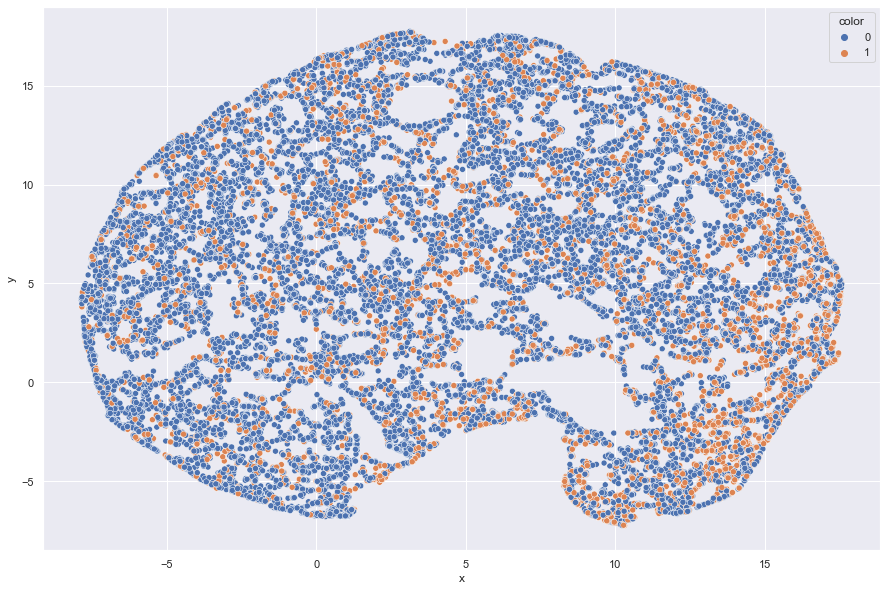

In [6]:
import matplotlib.pyplot as plt
plot = {"x": new_features[:, 0], "y": new_features[:, 1], "color": dataset.labels().numpy()}

sns.set()
fig, ax = plt.subplots(figsize=(15, 10))
sns.scatterplot(x="x", y="y", hue="color", data=plot, ax=ax)

In [10]:
fig = px.scatter(x=output[:,0], y=output[:,1], color=dataset.labels().numpy())
fig.show()

In [2]:
from datasets import UCIDataset
from data_utils import t_sne
dataset = UCIDataset('adult', mode='train')
X = dataset.features().numpy()
original = t_sne(X, pca_comp=10)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 22561 samples in 0.019s...
[t-SNE] Computed neighbors for 22561 samples in 2.094s...
[t-SNE] Computed conditional probabilities for sample 1000 / 22561
[t-SNE] Computed conditional probabilities for sample 2000 / 22561
[t-SNE] Computed conditional probabilities for sample 3000 / 22561
[t-SNE] Computed conditional probabilities for sample 4000 / 22561
[t-SNE] Computed conditional probabilities for sample 5000 / 22561
[t-SNE] Computed conditional probabilities for sample 6000 / 22561
[t-SNE] Computed conditional probabilities for sample 7000 / 22561
[t-SNE] Computed conditional probabilities for sample 8000 / 22561
[t-SNE] Computed conditional probabilities for sample 9000 / 22561
[t-SNE] Computed conditional probabilities for sample 10000 / 22561
[t-SNE] Computed conditional probabilities for sample 11000 / 22561
[t-SNE] Computed conditional probabilities for sample 12000 / 22561
[t-SNE] Computed conditional probabilities for sa

In [4]:
import plotly.express as px
fig = px.scatter(x=original[:,0], y=original[:,1], color=dataset.labels().numpy())
fig.show()